# Strawberry Object Detection

In this experiment, we are assigned to detect and count strawberries on
trees using a Computer Vision algorithm. To achieve this, we must complete the following:
- to implement and train the object detector on StrawDI dataset (https://strawdi.github.io/)
- to integrate the trained object detector into a tracking algorithm to perform tracking on strawberries detected in the video sequence (test.mp4)

## Setup

### Connect the notebook to your Google Drive

In [1]:
from google.colab import drive

drive.mount('/content/gdrive', force_remount=True)
# Go to the working directory
%cd /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/

Mounted at /content/gdrive
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking


We're unzipping the dataset to the colab disk.

In [2]:
!unzip "dataset.zip"

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/img/1817.png  
  inflating: __MACOSX/dataset/train/img/._1817.png  
  inflating: dataset/train/img/2488.png  
  inflating: __MACOSX/dataset/train/img/._2488.png  
  inflating: dataset/train/img/415.png  
  inflating: __MACOSX/dataset/train/img/._415.png  
  inflating: dataset/train/img/1181.png  
  inflating: __MACOSX/dataset/train/img/._1181.png  
  inflating: dataset/train/img/367.png  
  inflating: __MACOSX/dataset/train/img/._367.png  
  inflating: dataset/train/img/1195.png  
  inflating: __MACOSX/dataset/train/img/._1195.png  
  inflating: dataset/train/img/401.png  
  inflating: __MACOSX/dataset/train/img/._401.png  
  inflating: dataset/train/img/371.png  
  inflating: __MACOSX/dataset/train/img/._371.png  
  inflating: dataset/train/img/1183.png  
  inflating: __MACOSX/dataset/train/img/._1183.png  
  inflating: dataset/train/img/417.png  
  inflating: __MACOSX/dataset/train/img/._417.png  
  inflati

In [2]:
!ls "/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/"

dataset				__MACOSX	  sequence  tracking.ipynb
dataset.zip			requirements.txt  test.mp4  tracking_output
DRC_mid_Takehome_test_2024.pdf	runs		  tracker


### Install and import Python libraries

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import sys
strawid_root_dir = "gdrive/My Drive/Colab_Notebooks/strawid_tracking/"
sys.path.append(os.path.join(strawid_root_dir))

!pip install tqdm lap

In [4]:
!python --version

Python 3.10.12


In [5]:
import random
import cv2

import time
from tqdm.autonotebook import tqdm

import numpy as np

from matplotlib import pyplot as plt
import matplotlib.patches as patches

import torch
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision import transforms

from tracker.data_obj_detect import StrawDIObjDetect, StrawDIObjDetectSmall, sort_files
from tracker.detector import FRCNN_FPN

from tracker.utils import obj_detection_transforms, train_one_epoch, validate_obj_detector, evaluate_obj_detection, filter_bboxes_by_prob
from tracker.visualization_utils import visualize_segmentation_mask, visualize_bounding_boxes, plot_sequence, generate_tracking_imseq, imseq_to_video, video_to_imseq

from tracker.tracker import HungarianIoUTracker
from tracker.data_track import StrawDISequence

<ipython-input-5-5b0c3be029dd>:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## Strawberry Digital Images Datasets (StrawDI)

StrawDI dataset provides 8000 images of strawberries, taken from 20 plantations, within an approximate area of 150 hectares, in the province of Huelva, Spain.

For each of these images a ground truth labelled image has been manually generated containing the individual segmentation of all the strawberries appearing in the image.

The images have been rescaled to 1008 x 756 and stored in PNG format. This set of images is taken from the StrawDI_Db1 database consisting of train images (2800 images), validation images (100 images) and test images (200 images) subsets.

For more details, please visit this [link](https://strawdi.github.io/)

In [6]:
dataset_dir = os.path.join(os.getcwd(), 'dataset')

print(dataset_dir)

train_dir = os.path.join(dataset_dir, 'train')
val_dir = os.path.join(dataset_dir, 'val')
test_dir = os.path.join(dataset_dir, 'test')

train_images = os.path.join(train_dir, 'img')
train_labels = os.path.join(train_dir, 'label')

val_images = os.path.join(val_dir, 'img')
val_labels = os.path.join(val_dir, 'label')

test_images = os.path.join(test_dir, 'img')

/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset


In [7]:
print(train_images)
print(val_images)

train_samples = sort_files([os.path.join(train_images, image_path) for image_path in os.listdir(train_images)])
train_labels = sort_files([os.path.join(train_labels, image_path) for image_path in os.listdir(train_labels)])

val_samples = sort_files([os.path.join(val_images, image_path) for image_path in os.listdir(val_images)])
val_labels = sort_files([os.path.join(val_labels, image_path) for image_path in os.listdir(val_labels)])

test_samples = sort_files([os.path.join(test_images, image_path) for image_path in os.listdir(test_images)])

num_train_samples = len(train_samples)
num_val_samples = len(val_samples)
num_test_samples = len(test_samples)

print(f"Number of Training samples: {num_train_samples}")
for i in range(0, 10):
  print(train_samples[i])
  print(train_labels[i])

print(f"Number of Validation samples: {num_val_samples}")
for i in range(0, 10):
  print(val_samples[i])
  print(val_labels[i])

print(f"Number of Test samples: {num_test_samples}")
for i in range(0, 10):
  print(test_samples[i])

/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/img
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/val/img
Number of Training samples: 2800
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/img/1.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/label/1.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/img/2.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/label/2.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/img/3.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/label/3.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/img/4.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/label/4.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/img/5.png
/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/dataset/train/label/5.png

Here, we visualize the image in the training set along with the segmentation mask associated to the image

Train Image Shape: torch.Size([756, 1008, 3])
Mask Image Shape: torch.Size([756, 1008, 3])


Text(0.5, 1.0, 'Training Label')

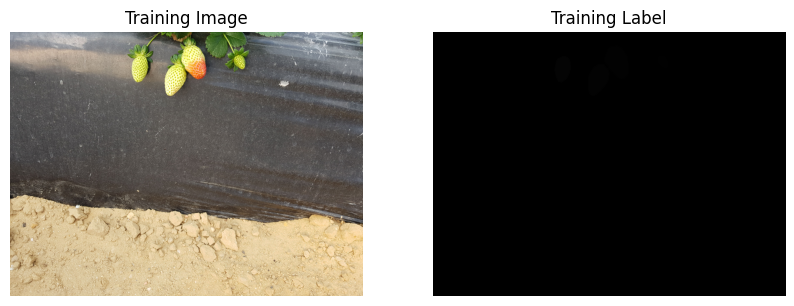

In [8]:
train_img = torch.from_numpy(cv2.cvtColor(cv2.imread(train_samples[0]), cv2.COLOR_BGR2RGB))
train_label = torch.from_numpy(cv2.cvtColor(cv2.imread(train_labels[0]), cv2.COLOR_BGR2RGB))
print(f"Train Image Shape: {train_img.shape}")
print(f"Mask Image Shape: {train_label.shape}")

fig = plt.figure(figsize = (10, 7))
rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)
plt.imshow(train_img.numpy())
plt.axis('off')
plt.title('Training Image')

fig.add_subplot(rows, columns, 2)
plt.imshow(train_label.numpy())
plt.axis('off')
plt.title('Training Label')


Here, we visualize each channel of the groundtruth segmentation labels. We can see that the segmentation mask has the fixed dimension of (H, W, 3) where H is the image height, W is the image width, and 3 indicates the number of channels in the segmentation mask.

Text(0.5, 1.0, 'Channel 2')

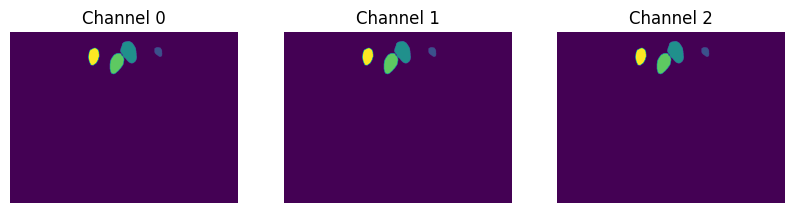

In [9]:
fig = plt.figure(figsize = (10, 7))
rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.imshow(train_label[:,:,0].numpy())
plt.axis('off')
plt.title('Channel 0')

fig.add_subplot(rows, columns, 2)
plt.imshow(train_label[:,:,1].numpy())
plt.axis('off')
plt.title('Channel 1')

fig.add_subplot(rows, columns, 3)
plt.imshow(train_label[:,:,2].numpy())
plt.axis('off')
plt.title('Channel 2')

However, the ground truth images are grayscale images that are the same size as the original rgb images and they are stored in PNG format. In the ground truth images, the value 0 is used for non-strawberry pixels, and strawberry pixels have the index of their strawberry, from 1 to the number of strawberries in the image.

Below we extract the unique values in the segmentation mask at each separate dimension. Then, we check that for each dimension, every values of the matrix is identical and each unique value (i.e. [0, 1, 2, 3, 4]) indicates the strawberry in the image.

Here, we visualize the segmentation masks over the original image. We can see the segmentation mask with value of 0 indicates the background and the value from 1 to the number of strawberries in the image indicates the strawberry.

Unique values in train_label channel 0:  [0 1 2 3 4]
Unique values in train_label channel 1:  [0 1 2 3 4]
Unique values in train_label channel 2:  [0 1 2 3 4]
Same with ever channels?:  True
[0 1 2 3 4]


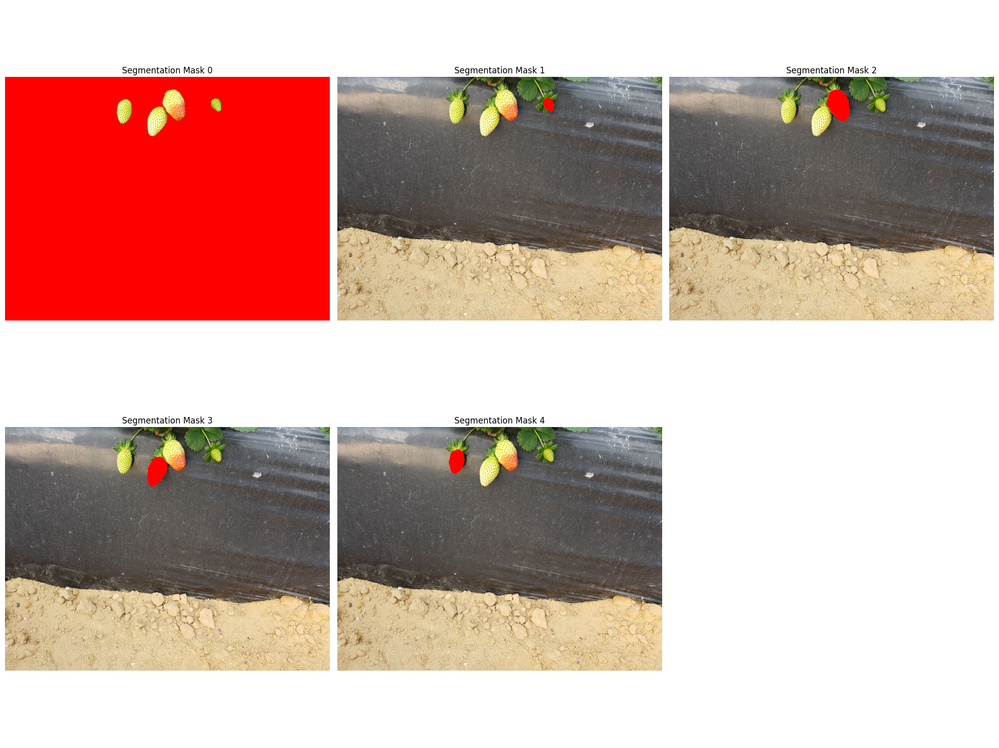

In [10]:
# Check how many unique values are there in the image
print("Unique values in train_label channel 0: ", np.unique(train_label[:,:,0].numpy()))
print("Unique values in train_label channel 1: ", np.unique(train_label[:,:,1].numpy()))
print("Unique values in train_label channel 2: ", np.unique(train_label[:,:,2].numpy()))

# Check if every channels are the same?
is_same_matrix  = (train_label[:,:,0].numpy() == train_label[:,:,1].numpy()).all() and (train_label[:,:,0].numpy() == train_label[:,:,2].numpy()).all()
print("Same with ever channels?: ", is_same_matrix)

unique_elements = np.unique(train_label[:,:,0].numpy())
print(unique_elements)
train_masks = np.zeros((train_label.numpy().shape[0], train_label.numpy().shape[1], unique_elements.shape[0]))

# Create binary masks for each unique identity
for i, val in enumerate(unique_elements):
    train_masks[:, :, i] = (train_label[:, :, 0].numpy() == val).astype(np.int16)

fig, ax = visualize_segmentation_mask(train_img, train_masks, separate_bb = True)

plt.tight_layout()
plt.show()


Here, we only visualize the set of segmentation mask indicating the strawberry in the input image.

To achieve this, we neglect the 0-index of the segmentation mask and pick the value from 1 to the number of strawberries in the image indicates the strawberry to generate the bounding boxes.

(756, 1008, 5)


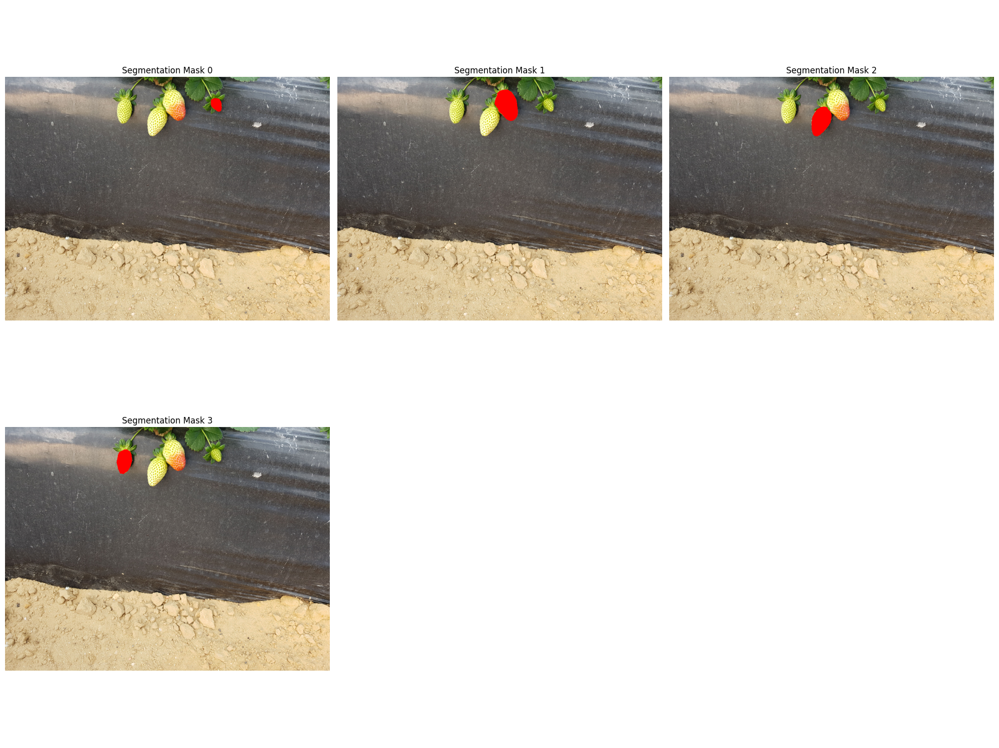

In [11]:
print(train_masks.shape)

# Background at Channel 0 --> Select only train masks for the object of interest
train_mask_foreground = train_masks[:,:, 1:]

fig, ax = visualize_segmentation_mask(train_img, train_mask_foreground, separate_bb = True)

plt.tight_layout()
plt.show()

## Prepare the StrawDI dataset for training, validating, testing

To prepare the StrawDI dataset, the process can be summarized as the following:

1. Converting Segmentation Masks to Bounding Boxes (available in the function "_get_annotation" in data_obj_detec.py)

- Convert the segmentation masks of strawberries into 2D bounding boxes.

2. Implementing the Dataset Object
We implemented a custom Dataset class that:

- Loads the input images from the StrawDI dataset.
- Extracts and returns the bounding boxes for each strawberry in an image.

3. Creating Training, Validation, and Testing Datasets
We created three instances of the custom Dataset class for:

- Training: Used to train the model.
- Validation: Used to tune hyperparameters and evaluate model performance during training.
- Testing: Used to assess the final model performance on unseen data.

4. Using DataLoader for Iteration
To efficiently iterate through the datasets, we used PyTorch's DataLoader class. The DataLoader:

- Provides an iterable over the dataset.
- Handles batching of data.
- Supports shuffling and loading data in parallel using multiprocessing workers.


This setup ensures that our model can be trained, validated, and tested efficiently with properly batched and prepared data.


Note: We also applied a smaller subset of the dataset for initial training and validation to save development time. This approach allows for quick iteration and helps identify overfitting early. If the model overfits, we can then scale up to a larger dataset.

In [12]:
def collate_fn(batch):
    return tuple(zip(*batch))

# Defining the smaller version of Dataset Objects
# num_train_samples = 5
# num_val_samples = 1
# train_dataset = StrawDIObjDetectSmall(os.path.join(dataset_dir, 'train'), num_train_samples, transforms=obj_detect_transforms(train=True))
# val_dataset = StrawDIObjDetectSmall(os.path.join(dataset_dir, 'val'), num_samples=num_val_samples, transforms=obj_detect_transforms(train=False))

# Defining the Dataset Objects
train_dataset = StrawDIObjDetect(os.path.join(dataset_dir, 'train'), transforms=obj_detection_transforms(train=True))
val_dataset = StrawDIObjDetect(os.path.join(dataset_dir, 'val'), transforms=obj_detection_transforms(train=False))
test_dataset = StrawDIObjDetect(os.path.join(dataset_dir, 'test'), transforms=obj_detection_transforms(train=False))

# Defining the DataLoader Objects
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)

Here, we visualize the bounding box wrapping around each strawberry in the separate block as below:

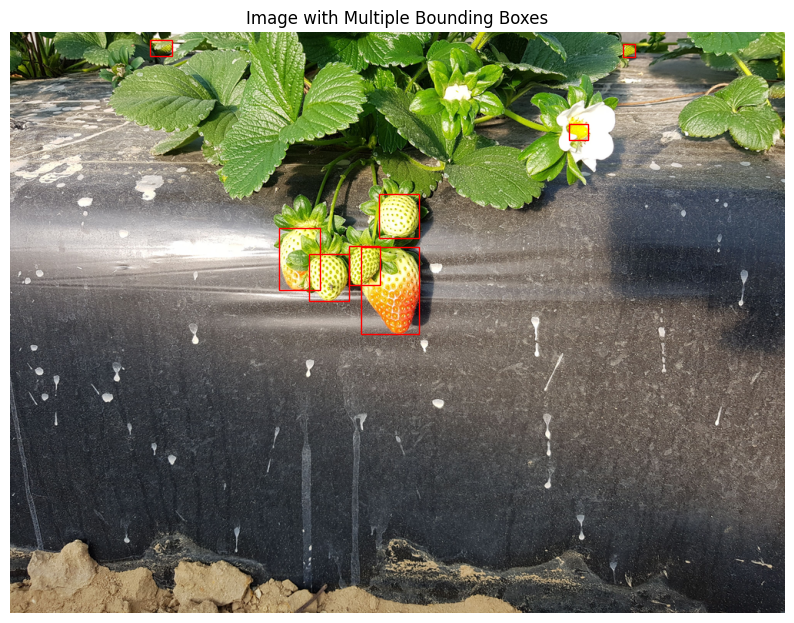

In [13]:
train_img, train_target = train_dataset.__getitem__(random.randint(0, len(train_dataset) - 1))
bounding_boxes =  train_target['boxes']

# Display the image
displayed_train_img = train_img.detach().clone().permute(1, 2, 0)

fig, ax = visualize_bounding_boxes(displayed_train_img, bounding_boxes, None, separate_bb = False)

# Set plot parameters
ax.axis('off')
ax.set_title('Image with Multiple Bounding Boxes')

plt.show()

In [14]:
fig, ax = visualize_bounding_boxes(displayed_train_img, bounding_boxes, None, separate_bb = True)

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

# Detection

In this experiment, we select the object detector [Faster R-CNN](https://https://arxiv.org/abs/1506.01497) with a pretrained [Resnet50](https://https://arxiv.org/abs/1512.03385) feature extractor for detecting multiple strawberries in an image frame.


We trained the native PyTorch implementation of Faster R-CNN as described in this section.

Reasons for Choosing Faster R-CNN
- Two-Stage Detector: Faster R-CNN is a two-stage detector, which provides higher accuracy compared to single-stage detectors. Although it is slower, counting strawberries in a video sequence can be performed offline, so real-time performance is not a concern.

- Tracking-by-Detection Paradigm: Our approach utilizes a tracking-by-detection paradigm, meaning we heavily rely on the object detector's performance to accurately detect strawberries in each image frame. High detection precision is crucial for effective tracking and counting of strawberries.

By leveraging the robustness of Faster R-CNN and the efficiency of ResNet-50, we aim to achieve reliable detection and tracking results for our strawberry counting proof of concept.

## Configuration

In [15]:
# Defining the hyperparameters required for the pipeline
num_epochs = 1
print_freq = 100
min_val_loss = float('inf')

# Set the device for the model to be trained, validated, and tested on --> GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Device: {device}")

# Define the multiple strawberry detection model
obj_detector = FRCNN_FPN(num_classes=train_dataset.num_classes, nms_threshold=0.3)
# Move the model to the device
obj_detector.to(device)

# Define the optimizer used for optimizing the model parameters
params = [p for p in obj_detector.parameters() if p.requires_grad]

optimizer = torch.optim.SGD(params, lr = 0.005, momentum=0.9, weight_decay=0.0005)

# Define the learning rate scheduler
warmup_factor = 1.0 / 1000
warmup_iters = min(1000, len(train_dataloader) - 1)

lr_scheduler = torch.optim.lr_scheduler.LinearLR(
    optimizer, start_factor=warmup_factor, total_iters=warmup_iters
    )

# Define the scaler
scaler = torch.cuda.amp.GradScaler()

Device: cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Training the multiple strawberry detection model

To demonstrate that our training pipeline functions properly, we intentionally trained our model for only 1 epochs.

Previously, we trained the model for 50 epochs and saved the weights with the best performance in the file 'best-obj-detector-parameters-50-epochs.pt'.

In [16]:
tb_writer = SummaryWriter('runs/strawdi_experiment_1')

for epoch in range(num_epochs):
    epoch_dict = {'cur_epoch': epoch + 1, 'total_epochs': num_epochs}
    train_one_epoch(obj_detector, optimizer, train_dataloader, device, epoch_dict, print_freq, lr_scheduler, scaler = scaler)
    # Compute the validation loss on the validation set
    val_loss = validate_obj_detector(obj_detector, val_dataloader, device)
    # Update the minimum validation loss
    if val_loss < min_val_loss:
        min_val_loss = val_loss
        # If the current state of the object detector produces lowest validation loss
        # - we automatically save the model parameters
        weights_path = os.path.join(os.getcwd(),'tracker', 'weights', f'best-obj-detector-parameters-{num_epochs}.pt')
        torch.save(obj_detector.state_dict(), weights_path)
        print(f"New best model saved with Validation Loss: {val_loss:.4f} at epoch {epoch}")

epoch: [1/1] [200/2800] time: 90.39 sec. Loss: 1.0639
epoch: [1/1] [400/2800] time: 61.16 sec. Loss: 0.8686
epoch: [1/1] [600/2800] time: 62.01 sec. Loss: 0.7745
epoch: [1/1] [800/2800] time: 62.02 sec. Loss: 0.6661
epoch: [1/1] [1000/2800] time: 61.70 sec. Loss: 0.5561
epoch: [1/1] [1200/2800] time: 61.55 sec. Loss: 0.5587
epoch: [1/1] [1400/2800] time: 61.55 sec. Loss: 0.5131
epoch: [1/1] [1600/2800] time: 61.31 sec. Loss: 0.4710
epoch: [1/1] [1800/2800] time: 61.17 sec. Loss: 0.4368
epoch: [1/1] [2000/2800] time: 61.94 sec. Loss: 0.4515
epoch: [1/1] [2200/2800] time: 61.44 sec. Loss: 0.4419
epoch: [1/1] [2400/2800] time: 61.17 sec. Loss: 0.4144
epoch: [1/1] [2600/2800] time: 61.09 sec. Loss: 0.3776
epoch: [1/1] [2800/2800] time: 61.33 sec. Loss: 0.3676
New best model saved with Validation Loss: 0.3799 at epoch 0


## Preparing the trained model for inference


After training and validating the object detector on the StrawDI dataset, we download the trained model parameters and configure the model for inference. This object detector serves as the foundation of our tracking pipeline, generating bounding boxes around strawberries in each image.

In [17]:
!ls "/content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/tracker/weights"

best-obj-detector-parameters-10.pt  best-obj-detector-parameters-50-epochs.pt
best-obj-detector-parameters-1.pt   best-obj-detector-parameters.pt


In [18]:
# Loading the best weights of the object detector after trainining for 50 epochs
obj_detector_weights_path = os.path.join(os.getcwd(),'tracker', 'weights', 'best-obj-detector-parameters-50-epochs.pt')
obj_detector_state_dict = torch.load(obj_detector_weights_path,
                                   map_location=lambda storage, loc: storage)
obj_detector.load_state_dict(obj_detector_state_dict)
obj_detector.eval()
obj_detector.to(device)

FRCNN_FPN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu)

## Evaluate the multiple strawberry detection performance

In this experiment, we evaluate the performance of the multiple object detection performance based on 5 key metrics:
* **Average Precision (AP)**: summarizes the precision-recall curve into a single scalar value. It measures the area under the precision-recall curve, where precision is plotted against recall. AP is calculated for each class and then averaged across all classes to obtain mAP (mean Average Precision).


* **Precision:** The proportion of true positive detections out of all positive detections (true positives + false positives). It measures how accurate the model is when it predicts an object.


* **Recall:** The proportion of true positive detections out of all ground truth objects (true positives + false negatives). It measures how well the model captures all instances of the object in the image.


* **True Positives (TP):** The number of correctly detected and localized objects that match ground truth annotations, contributing positively to metrics like precision, recall, and average precision (AP).


* **False Positives (FP):** The number of incorrectly detected objects that do not match ground truth annotations or have low overlap with them, impacting precision negatively.

In [19]:
eval_results = evaluate_obj_detection(obj_detector, test_dataloader)
for k, v in eval_results.items():
  print(f"{k}: {v}")

  0%|          | 0/200 [00:00<?, ?it/s]

ap: 0.7858971357345581
precision: 0.8011695742607117
recall: 0.9681978821754456
tp: 1096.0
fp: 272.0


## Visualizing the detection output

Once the training, validation, and testing phases of our Faster R-CNN-based Strawberry detector are complete, we proceed to visualize the detections generated by our trained model on the unseen data, as shown below:

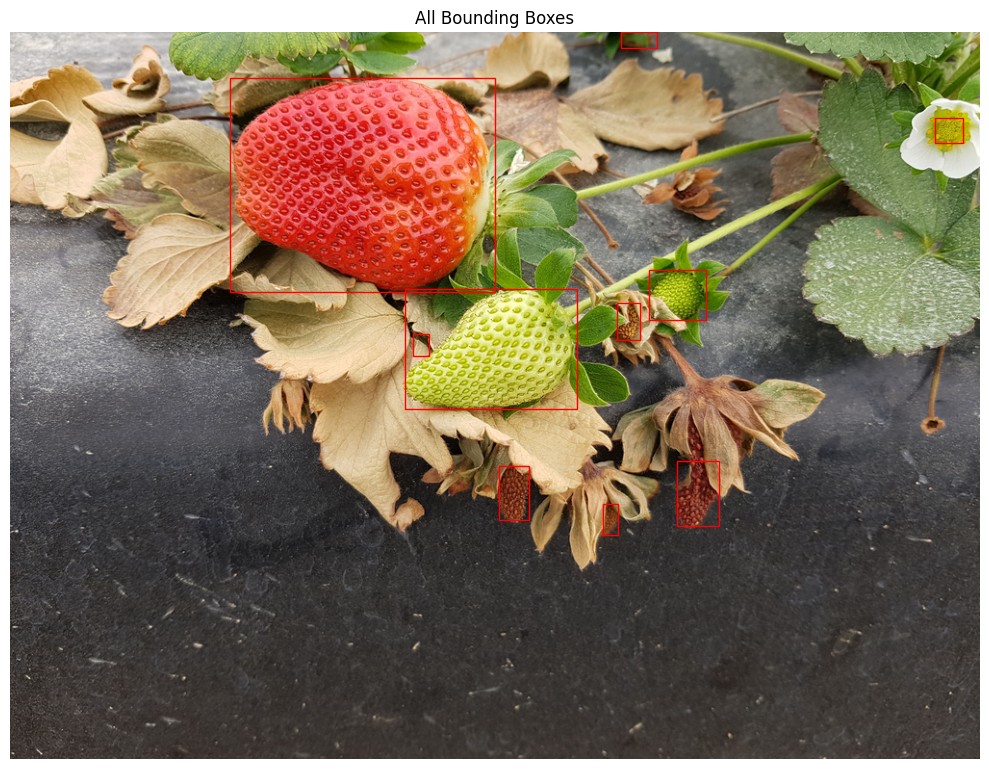

In [20]:
obj_detector.eval()

test_img, test_target = test_dataset.__getitem__(52)

displayed_test_img = test_img.permute(1, 2, 0).detach().clone()

test_img = test_img.unsqueeze(0)

pred = obj_detector.detect(test_img)

bounding_boxes, probs = pred[0], pred[1]

fig, ax = visualize_bounding_boxes(displayed_test_img, bounding_boxes, probs, separate_bb = False)

# Set plot parameters
ax.set_title('All Bounding Boxes')

plt.tight_layout()
plt.show()

To eliminate the number of irrelevant bounding boxes, we also implemented the function to get the bounding boxes with the probability greater than the threshold value to pick the bounding boxes that the model is most confident about. If it is not so confident about the detections, it filters out the bounding boxes with the probailility lower than the probability threshold.

During the tracking process, this will be used as part of detection in the tracking pipeline to filter out the false positives/negatives as many as possible.

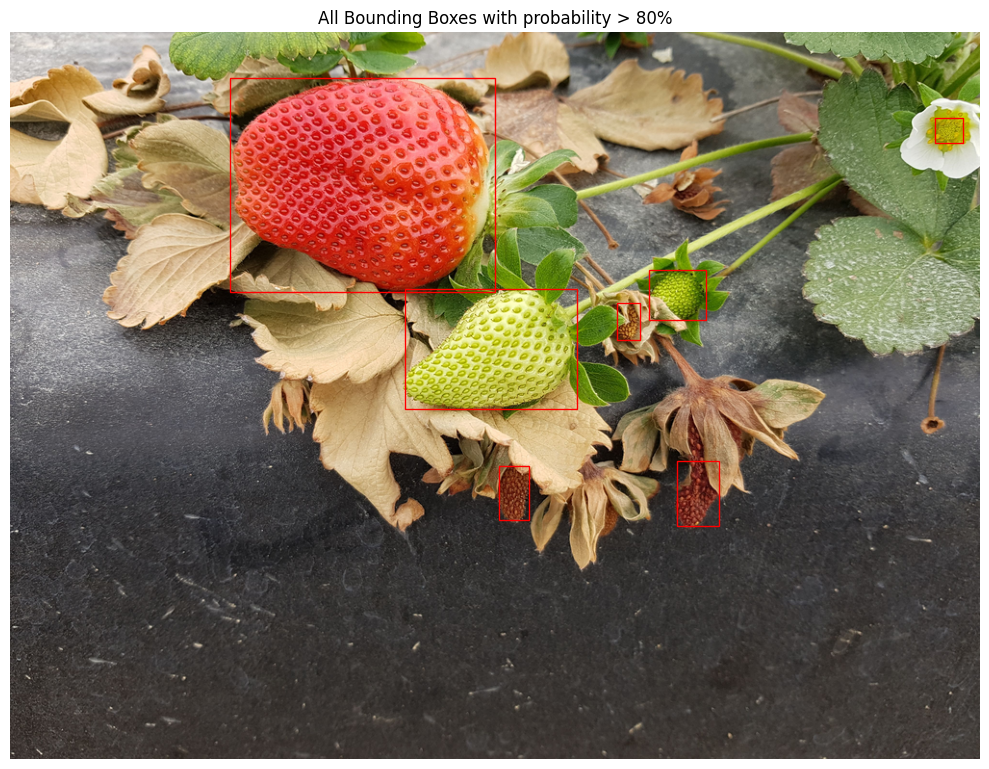

In [21]:
bounding_boxes, probs = filter_bboxes_by_prob(obj_detector.detect(test_img), 0.80)

fig, ax = visualize_bounding_boxes(displayed_test_img, bounding_boxes, probs, separate_bb = False)

# Set plot parameters
ax.set_title('All Bounding Boxes with probability > 80%')

plt.tight_layout()
plt.show()

# Tracking

To effectively count strawberries in a video sequence despite camera movement, a tracking algorithm is essential. This algorithm tracks the identity and location of detections as the camera translates in various directions.


## Process the video sequence to image frames

Given the test video (test.mp4), we need to extract each frame from the video and save them into a folder named 'sequence'. Subsequently, we will use this extracted image sequence to execute detections on each individual frame and then apply tracking.

In [22]:
video_path = os.path.join(os.getcwd(), 'test.mp4')
output_path = os.path.join(os.getcwd(), 'sequence')

In [ ]:
video_to_imseq(video_path, output_path)

In [23]:
# Create the list of file paths
test_sequence = sort_files([os.path.join(output_path, image_path) for image_path in os.listdir(output_path)])

print(f"Number of frames in the video: {len(test_sequence)}")

for i in range(0, 10):
  print(f"Image at frame {i}: {test_sequence[i]}")

Number of frames in the video: 754
Image at frame 0: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/0.png
Image at frame 1: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/1.png
Image at frame 2: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/2.png
Image at frame 3: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/3.png
Image at frame 4: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/4.png
Image at frame 5: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/5.png
Image at frame 6: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/6.png
Image at frame 7: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/7.png
Image at frame 8: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/8.png
Image at frame 9: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/sequence/9.png


Once we have a sorted list of images in the 'sequence' folder, we can feed this list into our tracker model. The tracker will then process each frame, associating detections across frames to track the movement and location of strawberries. Ultimately, the number of strawberries detected in the video sequence will be extracted as the number of tracks generated by the tracker.

Sequence Frame dimension: torch.Size([1, 3, 756, 1008])


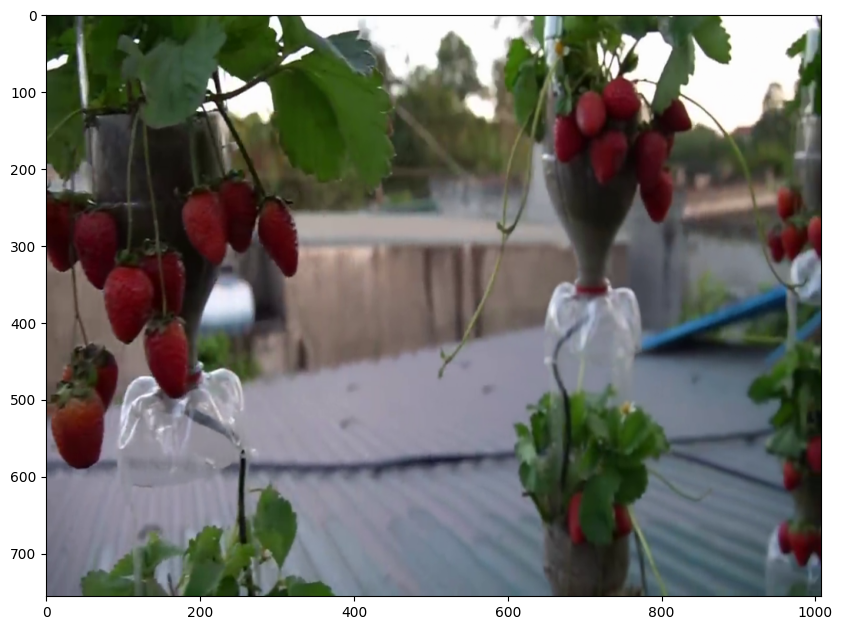

In [24]:
transform = transforms.ToTensor()
sequence_frame = transform(cv2.cvtColor(cv2.imread(test_sequence[30]), cv2.COLOR_BGR2RGB))
displayed_sequence_frame = sequence_frame.permute(1, 2, 0).detach().clone()
sequence_frame = sequence_frame.unsqueeze(0)
print(f"Sequence Frame dimension: {sequence_frame.shape}")

fig, ax = plt.subplots(figsize=(10,10))
# Display the image
ax.imshow(displayed_sequence_frame.numpy())


Here, we demonstrate that we can apply our trained strawberry object detector to detect strawberries in a frame from the test video (test.mp4).


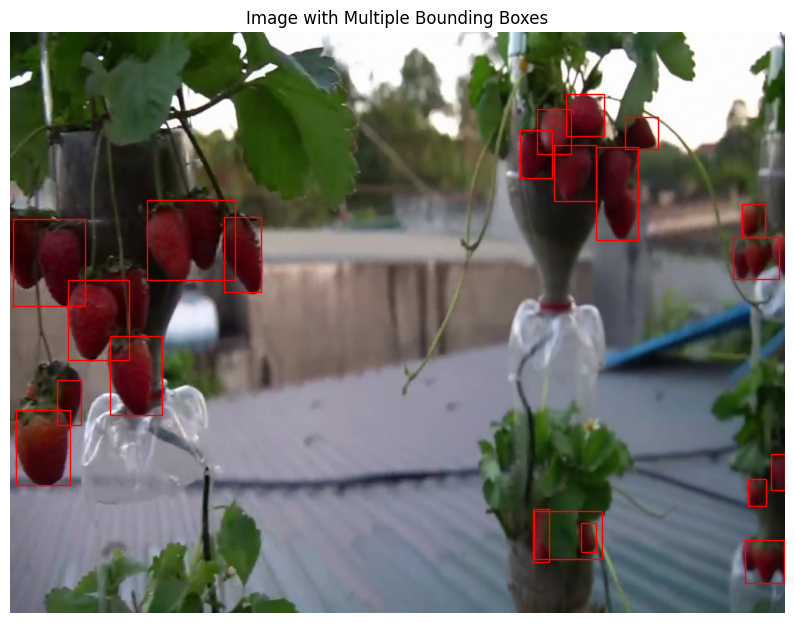

In [25]:
bounding_boxes, probs = filter_bboxes_by_prob(obj_detector.detect(sequence_frame), 0.95)

fig, ax = visualize_bounding_boxes(displayed_sequence_frame, bounding_boxes, probs, separate_bb = False)

# Set plot parameters
ax.axis('off')
ax.set_title('Image with Multiple Bounding Boxes')

plt.show()

Based on my observation, the detector successfully identifies bounding boxes around strawberries, although there are instances of false positives and false negatives. These occur particularly where strawberries are occluded by other strawberries, leaves, branches, or the plastic cap of the container, which shares similar colors with ripe strawberries.

## Run Tracking Algorithm

Given the shuffled order of images in the StrawDI dataset, sorting by file name does not establish the necessary sequential context for deep learning-based methods. Due to this limitation it is not feasible to use the appearance models like [Re-Identification (Re-ID)](https://https://en.wikipedia.org/wiki/Data_re-identification) and [Graph Neural Networks](https://en.wikipedia.org/wiki/Graph_neural_network), as well as motion-based approaches.

Moreover, the video spans 25 seconds with 754 frames, where object motion between frames is minimal. This is ideal for a Tracking-by-Detection approach, which involves detecting objects in each frame and then associating these detections over time based on location, appearance, or motion.

To accurately match detections to tracks without needing sequential data for learning, we use the [Hungarian algorithm](https://https://en.wikipedia.org/wiki/Hungarian_algorithm) with the [IoU](https://https://en.wikipedia.org/wiki/Jaccard_index) metric in the data association step to match new predictions with tracks. The steps can be briefly described as follows:

1. Define Distances Between Boxes: Calculate the distances between bounding boxes using IoU as the metric.

2. Solve Unique Matching: Apply the Hungarian algorithm to solve the unique matching problem.

3. Minimize Total Cost: The solutions provided by the algorithm are unique assignments that minimize the total cost.

For more information, the implementation details is available in the class HungarianIoUTracker.

In [26]:
# from tracker.data_track import StrawDISequence
tracker = HungarianIoUTracker(obj_detector)
seq = StrawDISequence(output_path, transform=transform)

In [27]:
tracker.reset()
now = time.time()

data_loader = DataLoader(seq, batch_size=1, shuffle=False)

for frame in tqdm(data_loader):
    tracker.step(frame)

results = tracker.get_results()

print(f"Tracks found: {len(results)}")
print(f"Runtime for {seq}: {time.time() - now:.1f} s.")

  0%|          | 0/754 [00:00<?, ?it/s]

Tracks found: 910
Runtime for <tracker.data_track.StrawDISequence object at 0x790be822a080>: 122.1 s.


## Visualizing the tracking output

Since we lack ground truth data to quantitatively assess tracking performance, we instead evaluate the results qualitatively by visualizing the tracking performance over the first n frames

In [28]:
plot_sequence(results, seq, first_n_frames= 10)

Output hidden; open in https://colab.research.google.com to view.

Additionally, we visualize the tracking performance over the entire video sequence (test.mp4) and save the output to the file 'output_video.mp4'.

In [29]:
track_out_path = os.path.join(os.getcwd(), 'tracking_output')
video_out_path = os.path.join(track_out_path, 'output_video.mp4')

generate_tracking_imseq(results, seq, track_out_path)
imseq_to_video(track_out_path, video_out_path)

Video sequence images has been saved at: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/tracking_output
num output image frames: 754
The output video has been saved at: /content/gdrive/MyDrive/Colab_Notebooks/strawid_tracking/tracking_output/output_video.mp4


# Conclusion

This experiment can be summarized into the following:


- We trained **Faster R-CNN architecture with the pretrained ResNet50 backbone** as a feature pyramid network of choice to detect and locate strawberries in a static image.


- **Quantitative results** (average precision, precision, recall, true positive, false positives) indicate that the trained detector can perform reasonably well with high number of true positves and low false positives.


- **Qualitative results** (visual) indicates that the trained detector can correctly locate most of strawberries with an exception in some edge cases (e.g. strawberries are occluded by other strawberries, leaves, branches, or the plastic cap of the container, which shares similar colors with ripe strawberries.)


- Our experiment demonstrates that we can **successfully apply object detection and tracking algorithms in order to extract the number of strawberries present in a video** in the case of translating camera
movement.


- Tracking performance heavily relies on the performance of the object detector as **the noisy detections can lead to the initialization of new tracks**. This causes the number of tracks (i.e. the number of strawberries) to excessively increases and the number of tracks become unrealistic.


- Lack of available dataset for tracking (e.g.learning similarity between strawberries, etc.) enforces us to use the conventional approach of **Hungarian Algorithm on IoU metric** for tracking. This causes the tracker to be prone to drifting, large camera motions, and large displacements due to low framerate. Thus, it becomes hard for the tracker to recover from errors or occlusions.